In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
from tqdm import tqdm

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
fcnt = 0
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        fcnt += 1
        if fcnt < 10 or fcnt > 2190:
            print(os.path.join(dirname, filename))
print(fcnt)

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/youtube-faces-with-facial-keypoints/youtube_faces_with_keypoints_full.csv
/kaggle/input/youtube-faces-with-facial-keypoints/youtube_faces_with_keypoints_full_3/youtube_faces_with_keypoints_full_3/Laurence_Fishburne_4.npz
/kaggle/input/youtube-faces-with-facial-keypoints/youtube_faces_with_keypoints_full_3/youtube_faces_with_keypoints_full_3/Kate_Capshaw_2.npz
/kaggle/input/youtube-faces-with-facial-keypoints/youtube_faces_with_keypoints_full_3/youtube_faces_with_keypoints_full_3/Larry_Nichols_0.npz
/kaggle/input/youtube-faces-with-facial-keypoints/youtube_faces_with_keypoints_full_3/youtube_faces_with_keypoints_full_3/Norman_Mineta_5.npz
/kaggle/input/youtube-faces-with-facial-keypoints/youtube_faces_with_keypoints_full_3/youtube_faces_with_keypoints_full_3/Kweisi_Mfume_1.npz
/kaggle/input/youtube-faces-with-facial-keypoints/youtube_faces_with_keypoints_full_3/youtube_faces_with_keypoints_full_3/Oliver_Phelps_0.npz
/kaggle/input/youtube-faces-with-facial-keypoints/youtube

In [2]:
import torch
import torchvision

In [3]:
#!pip install torchinfo

In [4]:
#from torchinfo import summary

In [5]:
#model = torch.load('/kaggle/input/faceid-model/faceid-model-0.0011414959120764233.pt', map_location=torch.device('cpu'))
#summary(model, (1, 1, 224, 224))

In [6]:
!mkdir -pv /kaggle/temp
!rm -Rf /kaggle/temp/*
!cp -as /kaggle/input/youtube-faces-with-facial-keypoints /kaggle/temp/
!mv /kaggle/temp/youtube-faces-with-facial-keypoints/*/*/*.npz /kaggle/temp/youtube-faces-with-facial-keypoints/
!ls /kaggle/temp/youtube-faces-with-facial-keypoints/ | wc

   2199    2199   45153


In [7]:
data_dir = '/kaggle/temp/youtube-faces-with-facial-keypoints'
#data_dir = '/kaggle/input/faceid-preprocessed'

In [8]:
df = pd.read_csv(f'{data_dir}/youtube_faces_with_keypoints_full.csv')
df

,videoID,personName,imageHeight,imageWidth,videoDuration,averageFaceSize,numVideosForPerson
0,Alison_Lohman_0,Alison_Lohman,228.0,213.0,240.0,90.150000,6.0
1,Alison_Lohman_1,Alison_Lohman,248.0,201.0,79.0,108.417722,6.0
2,Alison_Lohman_2,Alison_Lohman,335.0,308.0,136.0,122.161765,6.0
3,Alison_Lohman_3,Alison_Lohman,151.0,110.0,53.0,58.000000,6.0
4,Alison_Lohman_4,Alison_Lohman,236.0,228.0,147.0,91.680272,6.0
...,...,...,...,...,...,...,...
2189,Yossi_Beilin_3,Yossi_Beilin,240.0,243.0,240.0,110.258333,2.0
2190,Zahir_Shah_0,Zahir_Shah,196.0,200.0,143.0,93.944056,2.0
2191,Zahir_Shah_1,Zahir_Shah,240.0,293.0,240.0,155.495833,2.0
2192,Zoran_Djindjic_0,Zoran_Djindjic,230.0,237.0,240.0,98.908333,2.0


In [9]:
import PIL
import cv2

class NormalizeTransform:
    def __init__(self, ratio=0.333):
        self.ratio = ratio

        self.jawPoints          = [ 0,17]
        self.rigthEyebrowPoints = [17,22]
        self.leftEyebrowPoints  = [22,27]
        self.noseRidgePoints    = [27,31]
        self.noseBasePoints     = [31,36]
        self.rightEyePoints     = [36,42]
        self.leftEyePoints      = [42,48]
        self.outerMouthPoints   = [48,60]
        self.innerMouthPoints   = [60,68]

        self.norm_transform = torchvision.transforms.Compose([
            torchvision.transforms.Resize((224, 224)),
            torchvision.transforms.functional.autocontrast,
            torchvision.transforms.functional.to_grayscale,
            torchvision.transforms.ToTensor(),
        ])

    def __call__(self, data, landmarks):
        data = self.face_transform(data, landmarks)
        img = PIL.Image.fromarray(data)
        data = self.norm_transform(img)
        return data

    def face_transform(self, data, landmarks):
        # see FaceId-Normalization.ipynb
        pt1 = self.avg(landmarks[self.leftEyePoints[0]:self.leftEyePoints[1]])
        pt2 = self.avg(landmarks[self.outerMouthPoints[0]:self.outerMouthPoints[1]])
        pt3 = self.avg(landmarks[self.rightEyePoints[0]:self.rightEyePoints[1]])
        src_pts = np.float32([pt1, pt2, pt3])
        dst_pts = np.float32([
            [data.shape[0]*self.ratio, data.shape[1]*self.ratio],
            [data.shape[0]/2, data.shape[1]*(1-self.ratio)],
            [data.shape[0]*(1-self.ratio), data.shape[1]*self.ratio]
        ])
        M = cv2.getAffineTransform(src_pts, dst_pts)
        data = cv2.warpAffine(data, M, data.shape[:2])
        return data
    
    def avg(self, pts):
        x = sum(x for x,y in pts) / len(pts)
        y = sum(y for x,y in pts) / len(pts)
        return x, y

In [10]:
import random
import pickle

class YouTubeFacesDataset(torch.utils.data.Dataset):
    def __init__(self, df, folder = '.', transform = NormalizeTransform(),
                 cache_lim = 200,
                 preload = False, preprocess = False,
                 anchor_set_len = 1, positive_set_len = 1, negative_set_len = 1,
                 stochastic_set_fraction = 0.8):
        self.transform = transform
        self.cache = {}
        self.cache_lim = 0 if preload else cache_lim
        self.preprocessed_cache = {}
        need_preprocessing = []
        self.data = {}
        for p in tqdm(df['personName'].unique(), desc='Loading data'):
            self.data[p] = []
            for fn, cnt in df[df['personName'] == p][['videoID', 'videoDuration']].values:
                fp = f'{folder}/{fn}.npz'
                cnt = int(cnt)
                self.data[p] += [(fp, i) for i in range(cnt)]
                if preload:
                    self.cache_lim += 1
                    imgs, lms = self._cache_get(fp)
                    assert imgs.shape[-1] == cnt
                    assert lms.shape[-1] == cnt
                if preprocess:
                    need_preprocessing += [fp]
        if preprocess:
            preprocessed = [self._preprocess(fp) for fp in tqdm(need_preprocessing, desc='Preprocessing')]
            self.preprocessed_cache = dict((fp, self._load_preprocessed(pfp)) for fp, pfp in tqdm(preprocessed, desc='Loading data'))
        self.persons = list(self.data.keys())
        self.neg_data = {}
        for p in self.persons:
            self.neg_data[p] = []
            for p_neg in self.persons:
                if p_neg == p:
                    continue
                self.neg_data[p] += self.data[p_neg]
        self.anchor_set_len = anchor_set_len
        self.positive_set_len = positive_set_len
        self.negative_set_len = negative_set_len
        self.stochastic_set_fraction = stochastic_set_fraction
    
    def __len__(self):
        return len(self.persons) * self.anchor_set_len * self.positive_set_len * self.negative_set_len
    
    def __getitem__(self, index):
        p_i = index // self.negative_set_len // self.positive_set_len // self.anchor_set_len
        assert p_i >= 0
        assert p_i < len(self.persons)
        p = self.persons[p_i]
        if self.negative_set_len > len(self.neg_data[p]) * self.stochastic_set_fraction:
            negative_i = index % self.negative_set_len
            negative_i = negative_i % len(self.neg_data[p])
        else:
            negative_i = random.randint(0, len(self.neg_data[p]) - 1)
        assert negative_i >= 0
        assert negative_i < len(self.neg_data[p])
        if self.positive_set_len > len(self.data[p]) * self.stochastic_set_fraction:
            positive_i = (index // self.negative_set_len) % self.positive_set_len
            positive_i = positive_i % len(self.data[p])
        else:
            positive_i = random.randint(0, len(self.data[p]) - 1)
        assert positive_i >= 0
        assert positive_i < len(self.data[p])
        if self.anchor_set_len > len(self.data[p]) * self.stochastic_set_fraction:
            anchor_i = (index // self.negative_set_len // self.positive_set_len) % self.anchor_set_len
            anchor_i = anchor_i % len(self.data[p])
        else:
            anchor_i = random.randint(0, len(self.data[p]) - 1)
        assert anchor_i >= 0
        assert anchor_i < len(self.data[p])
        return self._load(*self.data[p][anchor_i]), self._load(*self.data[p][positive_i]), self._load(*self.neg_data[p][negative_i])
    
    def _load(self, fp, i):
        if fp in self.preprocessed_cache:
            assert i < len(self.preprocessed_cache[fp]), (fp, i, len(self.preprocessed_cache[fp]))
            if self.preprocessed_cache[fp][i] is not None:
                return self.preprocessed_cache[fp][i]
        imgs, lms = self._cache_get(fp)
        assert i < imgs.shape[-1], (fp, i, imgs.shape[-1])
        data = imgs[:,:,:,i]
        assert i < lms.shape[-1], (fp, i, lms.shape[-1])
        lms = lms[:,:,i]
        if self.transform:
            data = self.transform(data, lms)
        return data
    
    def _cache_get(self, fp):
        if fp in self.cache:
            return self.cache[fp]
        if len(self.cache) > self.cache_lim:
            idx = random.randint(0, len(self.cache) - 1)
            key = list(self.cache.keys())[idx]
            del self.cache[key]
        d = np.load(fp)
        # trigger lazy loading
        self.cache[fp] = (d['colorImages'], d['landmarks2D'])
        return self.cache[fp]
    
    def _preprocess(self, fp):
        pfp = f'{fp}.pkl'
        if not os.path.exists(pfp):
            imgs, lms = self._cache_get(fp)
            d = [self._load(fp, i) for i in range(imgs.shape[-1])]
            with open(pfp, 'wb') as f:
                pickle.dump(d, f)
        return (fp, pfp)
    
    def _load_preprocessed(self, pfp):
        with open(pfp, 'rb') as f:
            return pickle.load(f)

#dataset = YouTubeFacesDataset(df, data_dir, preprocess = True)
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1)
len(dataset)

Loading data: 100%|██████████| 828/828 [00:02<00:00, 307.83it/s]


828

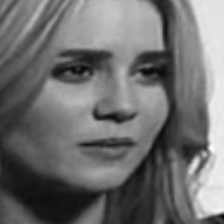

In [11]:
to_pil = torchvision.transforms.ToPILImage()
to_pil(dataset[0][0])

In [12]:
def cos_similarity(v1, v2):
    val = np.inner(v1,v2)/(np.linalg.norm(v1)*np.linalg.norm(v2))
    return val.reshape(-1)[0]

def euc_similarity(v1, v2):
    return np.linalg.norm(v1-v2)

In [13]:
def validate(model_f):
    model = torch.load(model_f, map_location=torch.device('cpu'))
    cnt = 20
    _, axs = plt.subplots(nrows=cnt, ncols=3, figsize=(3*4, cnt*4))
    for i in range(cnt):
        idx = random.randint(0, len(dataset)-1)
        img1, img2, img3 = dataset[idx]
        v1 = model(img1.reshape(1, 1, 224, 224)).detach().numpy()
        v2 = model(img2.reshape(1, 1, 224, 224)).detach().numpy()
        v3 = model(img3.reshape(1, 1, 224, 224)).detach().numpy()
        title = '%d %f %f %f %f %f %f' % (idx,
            euc_similarity(v1, v2), euc_similarity(v1, v3),
            cos_similarity(v1, v2), cos_similarity(v1, v3),
            np.vstack((v1, v2, v3)).min(), np.vstack((v1, v2, v3)).max())
        plt.sca(axs[i, 0])
        plt.imshow(img1.reshape(224, 224), cmap='gray')
        plt.axis('off')
        plt.sca(axs[i, 1])
        plt.imshow(img2.reshape(224, 224), cmap='gray')
        plt.axis('off')
        plt.title(title)
        plt.sca(axs[i, 2])
        plt.imshow(img3.reshape(224, 224), cmap='gray')
        plt.axis('off')
        print(title)

215 1.788989 10.695801 0.974803 -0.034452 -4.649449 4.770626
664 1.624346 10.471413 0.977295 0.410144 -4.569862 5.183669
81 3.551421 8.257667 0.775220 0.272760 -3.560403 4.111585
13 5.768476 5.258846 0.790164 0.554026 -4.115699 4.194591
593 4.709484 10.347980 0.772107 0.441834 -5.211540 4.223753
509 4.319038 11.789674 0.869885 -0.120538 -4.225711 3.880912
272 2.358662 7.993977 0.942260 0.457418 -5.060730 3.292335
34 3.548903 4.559496 0.921788 0.839278 -3.421165 3.725348
268 6.314550 7.921660 0.725803 0.466201 -4.554499 3.941703
387 4.821251 7.731276 0.767660 0.343772 -3.697377 3.444517
15 2.649647 11.701304 0.981586 -0.166667 -6.531021 4.698774
729 2.254466 12.307915 0.946284 -0.177788 -3.280699 4.446181
781 3.314372 7.753739 0.820936 0.563025 -3.684882 3.677973
450 2.252379 6.595610 0.974713 0.732964 -4.570659 4.862503
569 2.799094 15.797285 0.973321 -0.237097 -4.502329 5.086878
177 3.535321 10.410255 0.955034 0.370101 -5.464544 4.982584
439 3.667202 6.025694 0.823377 0.501226 -2.5436

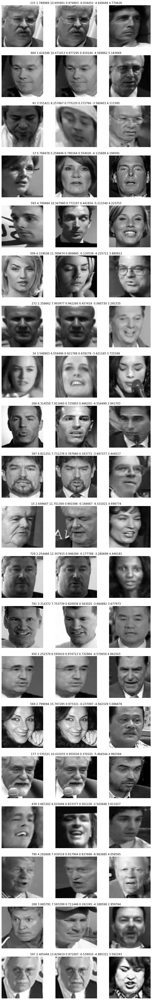

In [15]:
validate('faceid-model-0.016750329740267147.pt')

708 3.416348 6.816278 0.739250 0.363965 -2.981114 2.927075
6 3.089488 9.338038 0.948754 0.301812 -5.401556 3.486839
571 2.606821 10.189754 0.940017 0.053777 -3.624728 3.668569
467 3.573481 6.740898 0.706595 0.517515 -3.908149 3.908576
369 5.891545 9.131584 0.857599 0.532444 -7.110246 4.266281
389 4.157590 13.227488 0.910128 -0.282654 -4.188266 5.024324
17 4.828243 8.030968 0.804696 0.434766 -4.534004 3.811343
780 4.446394 9.338481 0.810991 0.385598 -4.941492 5.686930
710 3.480835 12.644325 0.933086 -0.116470 -4.227495 5.071766
600 2.511083 13.365460 0.966295 0.026407 -5.057479 2.880294
174 4.175397 15.265415 0.903305 -0.516270 -4.984204 4.047482
798 5.065600 7.198180 0.882425 0.740276 -7.250141 4.081110
561 4.477576 12.245667 0.841311 -0.201366 -5.504268 4.223840
422 3.553142 5.548465 0.856473 0.722276 -4.251353 3.513596
458 2.102114 15.285866 0.963058 -0.590234 -4.813885 4.133911
437 2.606072 9.775941 0.930736 0.029917 -3.586167 4.421914
432 2.151933 6.848730 0.950482 0.582911 -4.6920

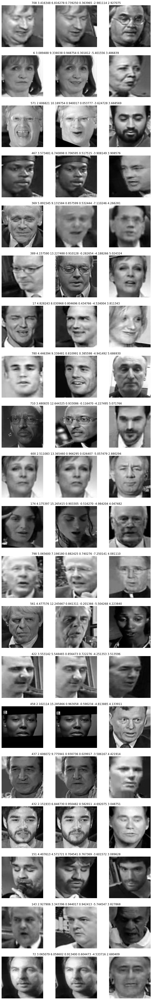

In [14]:
validate('faceid-model-0.02253507034381968.pt')

402 3.840225 8.426763 0.739334 0.308300 -2.998316 5.057732
67 4.407758 6.887810 0.607105 0.262453 -2.918213 2.577297
728 5.899839 4.599284 0.453809 0.769428 -3.225235 3.284363
812 2.633176 6.467787 0.943266 0.671039 -3.368434 3.898945
372 2.840107 5.796497 0.872684 0.509613 -2.534597 3.515719
735 4.729981 11.187401 0.764924 -0.087360 -3.363418 4.097666
20 3.506842 7.483396 0.893998 0.500148 -4.424347 3.598497
598 2.193256 5.194755 0.932802 0.532052 -2.417810 2.996754
351 2.633630 4.678263 0.933756 0.701147 -2.546954 4.730041
511 4.077346 11.256337 0.835148 -0.163932 -3.511363 4.020084
345 4.410954 4.079651 0.561313 0.563176 -2.569445 1.929463
129 4.992904 4.389800 0.700206 0.806417 -3.081271 3.628548
402 6.199159 7.202114 0.256689 0.226450 -2.237360 2.932560
9 2.757904 8.145828 0.946270 0.403860 -4.163429 4.019735
388 4.159005 6.537259 0.816398 0.486904 -2.914595 3.150667
597 4.218526 6.831909 0.885670 0.667373 -3.463912 3.785365
82 4.857264 5.547278 0.787789 0.645200 -2.802956 4.43206

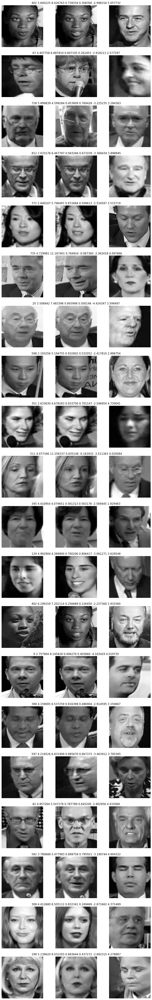

In [14]:
validate('faceid-model-0.0002570553115155849.pt')

9 0.740021 0.445682 0.595363 0.888487 -0.433293 0.486653
15 0.473456 0.784707 0.895348 0.675307 -0.408525 0.491511
254 0.526471 0.601397 0.559729 0.802745 -0.412288 0.475849
716 0.375576 1.092103 0.899229 -0.054835 -0.384880 0.407987
638 0.571261 0.521342 0.705063 0.758544 -0.318313 0.358921
635 0.353123 0.512219 0.935582 0.867032 -0.355058 0.536684
163 0.375806 0.527319 0.958395 0.883097 -0.354643 0.547786
414 0.431984 0.711427 0.798300 0.300680 -0.304539 0.303321
817 0.354420 0.684790 0.927383 0.687346 -0.430047 0.509194
629 0.929185 0.538429 0.812011 0.797421 -0.462794 0.627975
618 0.407555 0.555414 0.873820 0.759297 -0.319378 0.416742
296 0.447865 0.837191 0.763308 0.149492 -0.307322 0.424895
215 0.795679 0.361824 0.853724 0.798821 -0.479991 0.631989
6 0.594371 0.674899 0.508393 0.582982 -0.338196 0.426073
441 0.342285 0.569440 0.901526 0.648651 -0.339241 0.407832
770 0.857858 0.729351 0.341415 0.357308 -0.293119 0.397536
732 0.907636 0.778473 0.451652 0.621717 -0.418323 0.476533
7

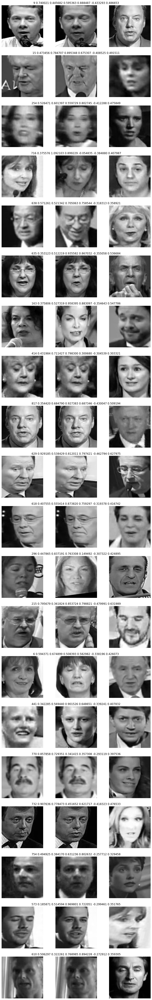

In [15]:
validate('faceid-model-0.008081951207714155.pt')

538 0.410361 0.608902 0.953930 0.851273 -0.527440 0.511499
336 0.286672 0.412242 0.967125 0.926273 -0.630402 0.393855
339 0.557506 0.521391 0.957406 0.945702 -0.719957 0.487250
566 0.415882 0.659405 0.951064 0.872902 -0.696363 0.547253
241 0.533318 0.561770 0.867338 0.861222 -0.620425 0.400736
76 0.365053 0.406606 0.914993 0.944062 -0.602901 0.377556
771 0.241285 0.372072 0.952460 0.915009 -0.546960 0.336873
687 0.476072 0.707862 0.953390 0.804640 -0.608917 0.398336
351 0.716240 0.849112 0.820589 0.701138 -0.673979 0.445062
488 0.562863 1.014232 0.528285 0.429019 -0.474359 0.508438
794 0.267992 0.260276 0.966637 0.978905 -0.559813 0.512214
249 0.492976 0.417988 0.881612 0.969394 -0.829483 0.529855
550 0.315526 0.810822 0.929051 0.642470 -0.576216 0.343330
120 0.477358 0.870742 0.859425 0.621837 -0.691644 0.376338
793 0.249468 0.460459 0.880362 0.773227 -0.347066 0.291283
267 0.608306 0.254953 0.808665 0.950493 -0.521835 0.372980
401 0.260031 0.314805 0.938848 0.898448 -0.405327 0.31467

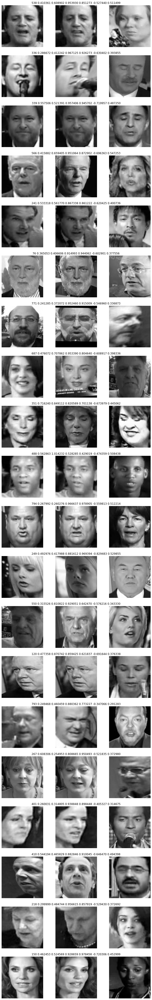

In [16]:
validate('faceid-model-0.008249358972534537.pt')

520 3.074026 7.208152 0.952670 0.751188 -6.503293 4.773307
738 1.787237 5.176799 0.985756 0.887303 -6.025243 5.341335
124 4.604083 8.262568 0.801069 0.667558 -6.054077 3.823952
296 5.786074 13.792849 0.636889 -0.259097 -4.459203 3.590066
736 1.598582 18.385534 0.979781 -0.548393 -6.157089 4.969202
0 4.049408 7.716862 0.961026 0.775195 -5.897466 5.365065
703 2.558834 5.831872 0.949991 0.834187 -4.143060 3.430765
586 4.870088 5.259725 0.462985 0.651137 -3.794237 3.173255
629 4.164845 13.191319 0.945611 0.147048 -6.387893 5.661386
384 2.671127 5.697741 0.826887 0.782292 -2.571048 4.213403
813 1.723736 11.397148 0.990292 0.307109 -6.271966 4.382136
213 2.842154 6.131847 0.933997 0.734794 -3.515155 3.033880
793 4.900362 10.095785 0.911922 -0.197895 -5.486174 4.072398
817 4.822549 9.152402 0.877502 0.412465 -5.977431 3.755403
763 2.382493 9.134627 0.967258 0.313433 -5.864240 3.086084
382 2.066249 13.067818 0.978523 0.116542 -4.702928 5.539897
573 4.024179 6.359932 0.754714 0.665321 -3.752560

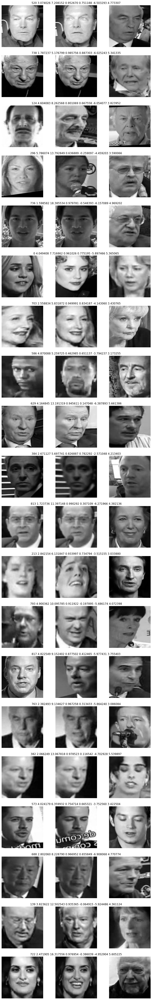

In [17]:
validate('faceid-model-0.011796065969605762.pt')

745 3.960143 6.579886 0.914024 0.836082 -6.010867 4.020628
698 1.854326 7.965004 0.923711 0.439465 -4.347511 2.351058
620 2.421020 13.556555 0.964936 -0.533313 -4.337931 4.058618
478 3.484046 6.510717 0.893191 0.720808 -4.328212 3.841355
459 4.644387 7.763160 0.780169 0.647901 -4.344418 3.227446
460 5.008030 8.007541 0.556220 0.207409 -3.221888 4.010483
411 2.836175 8.706067 0.932473 0.631596 -5.596416 4.078389
53 6.001029 6.012530 0.724129 0.866449 -4.741268 4.772005
358 3.627992 11.446774 0.960045 0.456302 -6.494298 4.175340
657 2.099848 9.705187 0.936770 0.341480 -3.681852 4.761565
247 4.822783 5.210314 0.894118 0.890312 -5.969524 3.621250
206 3.828916 13.213808 0.947140 0.192336 -5.898195 5.174243
398 2.896693 8.072711 0.940708 0.064840 -4.169601 2.270455
493 5.327940 5.466275 0.681815 0.658664 -3.312049 3.531520
762 4.136270 8.842560 0.927198 0.460055 -5.376250 4.169872
645 3.068585 9.737109 0.924375 0.340763 -4.146318 4.145075
106 4.506290 12.758248 0.865744 -0.101971 -4.128115 4

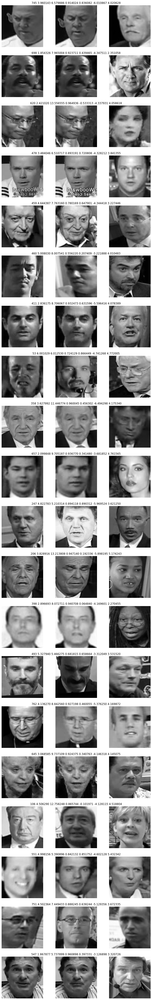

In [18]:
validate('faceid-model-0.020908821740486628.pt')

246 3.155813 3.885752 0.746728 0.672667 -2.420736 2.540532
588 2.794074 5.003355 0.737277 0.427887 -2.449654 2.657824
678 2.636689 4.123708 0.828555 0.630404 -2.831272 2.035904
672 2.579945 3.659734 0.866042 0.728343 -2.223118 2.894625
195 3.723489 5.632895 0.512652 0.277144 -2.796054 2.661030
117 3.211999 3.933084 0.626784 0.509206 -2.193560 1.553041
37 4.726456 4.527796 0.473186 0.349299 -2.322271 1.765638
700 2.820150 3.249096 0.896408 0.670840 -3.008554 2.514395
459 3.213598 3.651479 0.697065 0.746572 -2.561163 2.410514
384 2.847021 3.852768 0.775911 0.593959 -3.021856 3.305606
93 3.341886 3.446449 0.640540 0.785220 -2.608567 2.128316
822 3.609219 3.052643 0.644421 0.703226 -2.231365 1.681834
811 3.711861 3.418751 0.559132 0.729472 -2.247322 2.200853
768 3.517646 2.762666 0.781206 0.719026 -2.701577 1.992853
742 3.699257 3.547096 0.809237 0.814530 -3.280724 2.032747
302 4.241069 4.771819 0.706294 0.462105 -2.977560 2.406061
356 4.716192 4.611052 0.671405 0.595881 -3.412112 2.206313

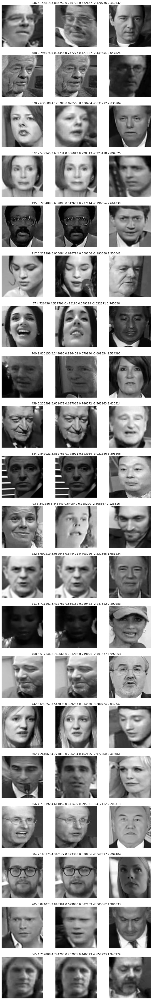

In [19]:
validate('faceid-model-0.22639933356643183.pt')